# SYNTHENTIC DATA PROJECT

FILENAME: synthetic_data.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 11-AUG-20

The purpose of this notebook is to create and replicate the core funtionalities of the 

## PHASE 1: PROJECT SETUP

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_rca = 80 # can change the amount of RCAs
    num_of_programs = 120 # number of programs

    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    # create lists of each for each of the ordinal column values
    project_values = []
    subproject_values = []
    rca_values = []
    program_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['rca'] = rca_values
    raw_df['program_title'] = program_values

    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

Sankey visualization function - used to plot data located in the passed dataframe argument

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

Invoke the 'init_array' function in order to create a sample budgetary data set of 10,000 records

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-10,subproject-39,program-35,rca-67,21821,13778.53,13774.78,17556.90,14891.39,12455.92
9991,project-20,subproject-22,program-78,rca-57,20364,18650.92,20000.93,15233.65,15267.00,12433.62
9992,project-12,subproject-3,program-40,rca-18,28678,21760.48,22978.65,14175.81,14447.01,11591.72
9993,project-20,subproject-3,program-88,rca-35,28939,20700.09,23332.42,28279.90,33847.41,30893.81
9994,project-10,subproject-15,program-28,rca-52,16864,8844.25,8261.19,8659.86,9293.53,7879.47
9995,project-14,subproject-36,program-77,rca-30,4202,4927.54,4852.60,5208.45,3145.84,2535.28
9996,project-16,subproject-11,program-83,rca-22,14345,12984.77,13411.44,9894.64,7156.60,5966.46
9997,project-4,subproject-21,program-58,rca-68,26134,26086.11,24036.81,29732.42,19014.82,15275.16
9998,project-6,subproject-36,program-114,rca-35,23377,17288.18,20352.59,16904.87,12135.39,12020.85
9999,project-19,subproject-27,program-83,rca-38,24469,25174.65,20257.95,24052.34,21239.67,17849.00


Create a unique key based on the concatenation of the 'project', 'subproject', 'program_title', 'rca' column values

In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0         project-20-subproject-6-program-39-rca-75
1         project-20-subproject-8-program-71-rca-68
2        project-6-subproject-38-program-113-rca-41
3       project-17-subproject-38-program-119-rca-40
4          project-18-subproject-4-program-1-rca-18
                           ...                     
9995     project-14-subproject-36-program-77-rca-30
9996     project-16-subproject-11-program-83-rca-22
9997      project-4-subproject-21-program-58-rca-68
9998     project-6-subproject-36-program-114-rca-35
9999     project-19-subproject-27-program-83-rca-38
Name: key, Length: 10000, dtype: object

Remove duplicate rows as a way to mitigate collisions

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                              key
2155  project-13-subproject-24-program-120-rca-67
4805     project-7-subproject-2-program-40-rca-56
8813    project-20-subproject-26-program-46-rca-5
9614     project-2-subproject-2-program-115-rca-5
Total count of duplicated rows :
4


Dropping all duplicte 'key' values 

In [8]:
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique 'key' values in data structures

Create a list of all column names for future iteration activities

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

Create a list of unique project values

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-8', 'project-7', 'project-3', 'project-20', 'project-9', 'project-18', 'project-19', 'project-10', 'project-12', 'project-14', 'project-11', 'project-13', 'project-16', 'project-17', 'project-15', 'project-2', 'project-5', 'project-6', 'project-4', 'project-1'}


Create a list of subproject values

In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-34', 'subproject-10', 'subproject-25', 'subproject-7', 'subproject-40', 'subproject-19', 'subproject-15', 'subproject-38', 'subproject-35', 'subproject-24', 'subproject-36', 'subproject-5', 'subproject-27', 'subproject-37', 'subproject-14', 'subproject-39', 'subproject-23', 'subproject-6', 'subproject-1', 'subproject-3', 'subproject-26', 'subproject-32', 'subproject-9', 'subproject-30', 'subproject-31', 'subproject-28', 'subproject-22', 'subproject-16', 'subproject-12', 'subproject-29', 'subproject-21', 'subproject-13', 'subproject-17', 'subproject-11', 'subproject-33', 'subproject-8', 'subproject-4', 'subproject-18', 'subproject-2', 'subproject-20'}


Create a list of unique RCA values

In [15]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-18', 'rca-46', 'rca-28', 'rca-4', 'rca-43', 'rca-68', 'rca-74', 'rca-60', 'rca-65', 'rca-22', 'rca-3', 'rca-24', 'rca-52', 'rca-23', 'rca-42', 'rca-53', 'rca-44', 'rca-34', 'rca-66', 'rca-2', 'rca-63', 'rca-77', 'rca-26', 'rca-13', 'rca-56', 'rca-29', 'rca-62', 'rca-72', 'rca-10', 'rca-59', 'rca-38', 'rca-19', 'rca-5', 'rca-70', 'rca-47', 'rca-61', 'rca-45', 'rca-71', 'rca-31', 'rca-80', 'rca-48', 'rca-15', 'rca-49', 'rca-9', 'rca-30', 'rca-7', 'rca-67', 'rca-36', 'rca-25', 'rca-79', 'rca-76', 'rca-33', 'rca-64', 'rca-20', 'rca-73', 'rca-57', 'rca-54', 'rca-39', 'rca-50', 'rca-14', 'rca-51', 'rca-6', 'rca-27', 'rca-16', 'rca-75', 'rca-37', 'rca-17', 'rca-58', 'rca-41', 'rca-40', 'rca-8', 'rca-12', 'rca-11', 'rca-69', 'rca-1', 'rca-32', 'rca-55', 'rca-21', 'rca-35', 'rca-78'}


Create a list of unique program title values

In [16]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-6', 'program-83', 'program-93', 'program-99', 'program-103', 'program-29', 'program-72', 'program-71', 'program-80', 'program-101', 'program-16', 'program-87', 'program-61', 'program-4', 'program-13', 'program-65', 'program-58', 'program-34', 'program-110', 'program-98', 'program-25', 'program-33', 'program-116', 'program-14', 'program-92', 'program-2', 'program-75', 'program-42', 'program-119', 'program-18', 'program-105', 'program-112', 'program-47', 'program-108', 'program-21', 'program-106', 'program-23', 'program-26', 'program-78', 'program-94', 'program-104', 'program-102', 'program-100', 'program-5', 'program-79', 'program-41', 'program-40', 'program-48', 'program-20', 'program-66', 'program-7', 'program-64', 'program-24', 'program-97', 'program-88', 'program-43', 'program-69', 'program-11', 'program-117', 'program-84', 'program-81', 'program-50', 'program-12', 'program-82', 'program-76', 'program-70', 'program-63', 'program-37', 'program-1', 'program-46', 'program-49'

### Visualize the generated data set

'Project' Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name,  # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Summarized Budget at the Project, Subproject, RCA, and Program levels

Group by and sum project, subproject, RCA, program level obligation values

In [18]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

Utilize the Network X graph in order to depict relationships across the budget hiearchy

#### Project to Subproject network graph

In [19]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-20,subproject-6
1,project-20,subproject-8
2,project-6,subproject-38
3,project-17,subproject-38
4,project-18,subproject-4
...,...,...
9995,project-14,subproject-36
9996,project-16,subproject-11
9997,project-4,subproject-21
9998,project-6,subproject-36


Create the networkx object and plot

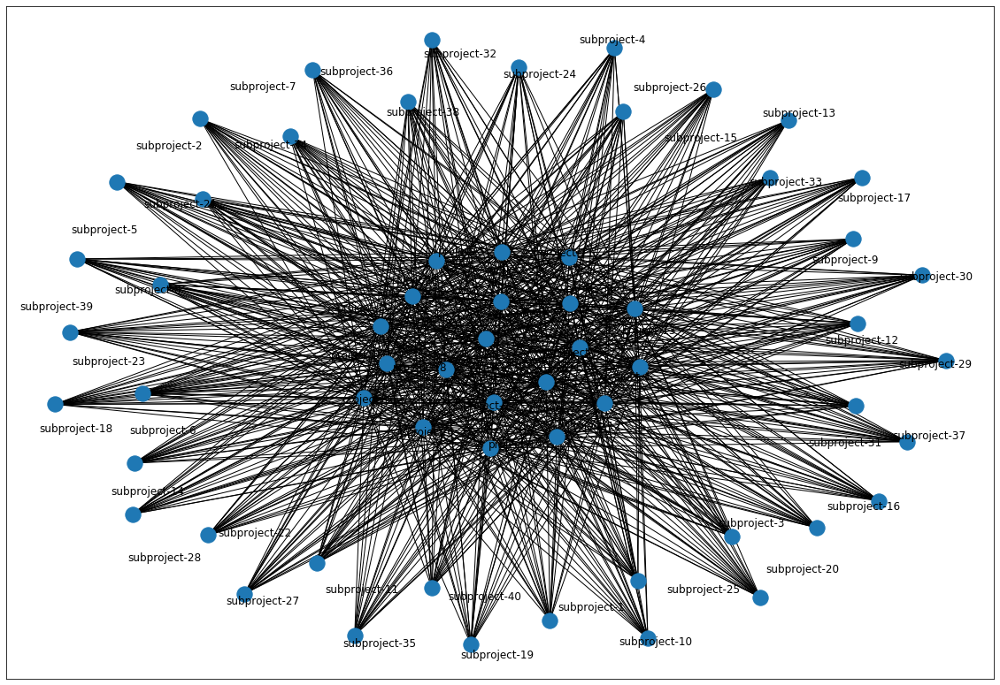

In [20]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [21]:
sum_df = train_df.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [22]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-6,program-39
1,subproject-8,program-71
2,subproject-38,program-113
3,subproject-38,program-119
4,subproject-4,program-1
...,...,...
9995,subproject-36,program-77
9996,subproject-11,program-83
9997,subproject-21,program-58
9998,subproject-36,program-114


Create the networkx object and plot

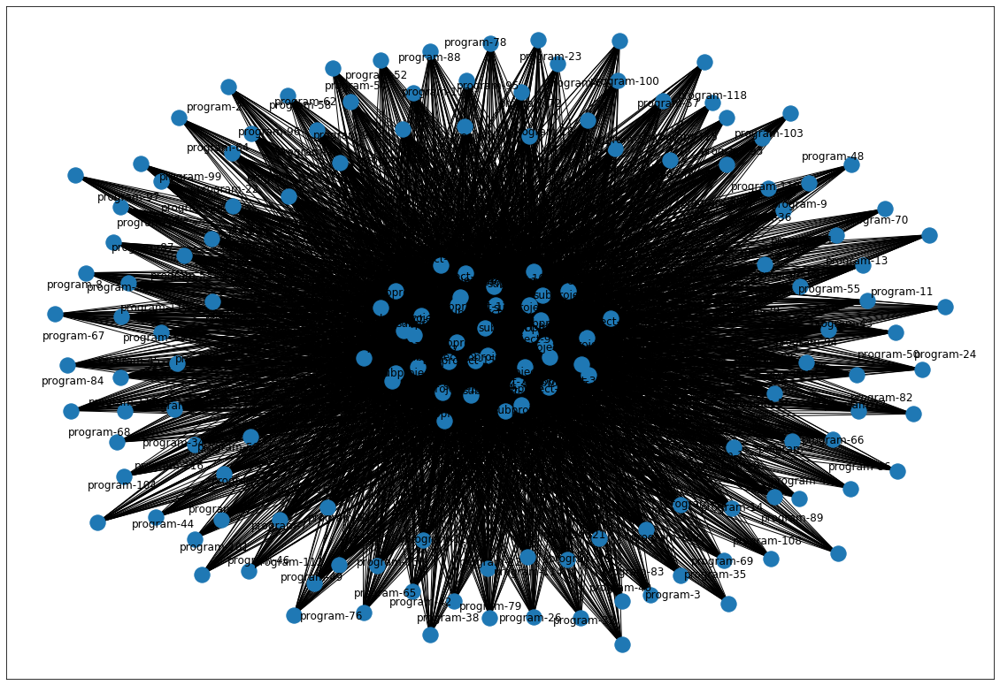

In [23]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

### Generate the sankey analysis 

Only retrieve the first 500 records

In [24]:
train_200 = train_df[:200].copy()

In [25]:
sum_df = train_200.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

In [48]:
train_df.head(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-20,subproject-6,program-39,rca-75,15422,14718.79,16863.78,12451.77,10691.37,10077.50,project-20-subproject-6-program-39-rca-75
1,project-20,subproject-8,program-71,rca-68,15037,11147.49,10147.27,8671.91,7953.20,7704.93,project-20-subproject-8-program-71-rca-68
2,project-6,subproject-38,program-113,rca-41,26789,27498.97,27027.58,27547.20,26885.21,22153.46,project-6-subproject-38-program-113-rca-41
3,project-17,subproject-38,program-119,rca-40,22756,11703.67,12672.74,15218.94,9781.26,8579.06,project-17-subproject-38-program-119-rca-40
4,project-18,subproject-4,program-1,rca-18,27284,15318.79,13508.70,12798.15,13680.94,11338.68,project-18-subproject-4-program-1-rca-18
5,project-19,subproject-30,program-1,rca-33,29980,29588.03,34025.01,22036.67,22597.15,19572.79,project-19-subproject-30-program-1-rca-33
6,project-20,subproject-10,program-81,rca-24,19490,10592.61,11066.25,12056.73,9079.97,8345.76,project-20-subproject-10-program-81-rca-24
7,project-11,subproject-8,program-75,rca-10,17845,16534.27,16867.80,14930.95,10089.80,9894.60,project-11-subproject-8-program-75-rca-10
8,project-12,subproject-19,program-78,rca-27,7624,4819.67,4884.91,4381.91,4513.56,4116.13,project-12-subproject-19-program-78-rca-27
9,project-17,subproject-29,program-99,rca-8,21619,26464.75,22607.89,24170.91,20915.45,19753.80,project-17-subproject-29-program-99-rca-8


# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

Create a shallow copy of the completed 'train_df' dataframe in order to conducted stand alone financial execution data analysis

In [26]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-20,subproject-6,program-39,rca-75,15422,14718.79,16863.78,12451.77,10691.37,10077.50,project-20-subproject-6-program-39-rca-75
1,project-20,subproject-8,program-71,rca-68,15037,11147.49,10147.27,8671.91,7953.20,7704.93,project-20-subproject-8-program-71-rca-68
2,project-6,subproject-38,program-113,rca-41,26789,27498.97,27027.58,27547.20,26885.21,22153.46,project-6-subproject-38-program-113-rca-41
3,project-17,subproject-38,program-119,rca-40,22756,11703.67,12672.74,15218.94,9781.26,8579.06,project-17-subproject-38-program-119-rca-40
4,project-18,subproject-4,program-1,rca-18,27284,15318.79,13508.70,12798.15,13680.94,11338.68,project-18-subproject-4-program-1-rca-18


Extract only the needed categorical columns

In [27]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice = exe_slice.rename(columns={'yr0_plan': "usd_value"})
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77
1,project-20-subproject-8-program-71-rca-68,project-20,subproject-8,program-71,rca-68,8671.91
2,project-6-subproject-38-program-113-rca-41,project-6,subproject-38,program-113,rca-41,27547.20
3,project-17-subproject-38-program-119-rca-40,project-17,subproject-38,program-119,rca-40,15218.94
4,project-18-subproject-4-program-1-rca-18,project-18,subproject-4,program-1,rca-18,12798.15


Assign year ending values to the dataframe

In [28]:
exe_slice['month'] = '12'
exe_slice['year'] = '2019'
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value,month,year
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019
1,project-20-subproject-8-program-71-rca-68,project-20,subproject-8,program-71,rca-68,8671.91,12,2019
2,project-6-subproject-38-program-113-rca-41,project-6,subproject-38,program-113,rca-41,27547.20,12,2019
3,project-17-subproject-38-program-119-rca-40,project-17,subproject-38,program-119,rca-40,15218.94,12,2019
4,project-18-subproject-4-program-1-rca-18,project-18,subproject-4,program-1,rca-18,12798.15,12,2019


Create a list of randomized obligated values for month ending 9-30-2019

In [29]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9052112428057256,
 0.9007853313749593,
 0.9358619409919897,
 0.9281790890245734,
 0.9225615331775643,
 0.9706319111984462,
 0.9326978512433416,
 0.967998378485093,
 0.9534002726427229,
 0.9584909184204455,
 0.9079766966266561,
 0.9145972233342885,
 0.921735977634474,
 0.9953666081868461,
 0.9597922667183144,
 0.9825286866714049,
 0.9340286020881399,
 0.9329692433289356,
 0.9795321957116339,
 0.9645609821242032,
 0.9585170593999016,
 0.9582114229071167,
 0.9612966522283084,
 0.9794746258854233,
 0.9946660427339036,
 0.9588576011703693,
 0.9754314381362794,
 0.9781578572416314,
 0.9252350273073389,
 0.9204215364933456,
 0.939437196490244,
 0.9686781393141337,
 0.9674037365424943,
 0.9870734150291315,
 0.918441140518234,
 0.9366115471875064,
 0.9815227620584358,
 0.9410971531611091,
 0.9643007786192633,
 0.9225814427605596,
 0.9643367285778748,
 0.9530443466582632,
 0.9258199384914912,
 0.990011508822613,
 0.9143022318669538,
 0.978696281485021,
 0.93461678734942,
 0.9397446141569077,


Calculate the end of year obligation values

In [30]:
exe_slice['oblig'] = exe_slice['usd_value'] * eoy_oblig
exe_slice

,key,project,subproject,program_title,rca,usd_value,month,year,oblig
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197
1,project-20-subproject-8-program-71-rca-68,project-20,subproject-8,program-71,rca-68,8671.91,12,2019,7811.529323
2,project-6-subproject-38-program-113-rca-41,project-6,subproject-38,program-113,rca-41,27547.20,12,2019,25780.376061
3,project-17-subproject-38-program-119-rca-40,project-17,subproject-38,program-119,rca-40,15218.94,12,2019,14125.901865
4,project-18-subproject-4-program-1-rca-18,project-18,subproject-4,program-1,rca-18,12798.15,12,2019,11807.080886
...,...,...,...,...,...,...,...,...,...
9995,project-14-subproject-36-program-77-rca-30,project-14,subproject-36,program-77,rca-30,5208.45,12,2019,5059.190253
9996,project-16-subproject-11-program-83-rca-22,project-16,subproject-11,program-83,rca-22,9894.64,12,2019,9602.438245
9997,project-4-subproject-21-program-58-rca-68,project-4,subproject-21,program-58,rca-68,29732.42,12,2019,29230.249433
9998,project-6-subproject-36-program-114-rca-35,project-6,subproject-36,program-114,rca-35,16904.87,12,2019,15841.567008


Create the execution burn rate percentages

In [31]:
eoy_exe = [random.uniform(0.6, .9) for x in range(df_len)]
eoy_exe

[0.7259026316041478,
 0.6317475141395883,
 0.7387793506515484,
 0.7778021554161417,
 0.8810240038992359,
 0.7002842901857759,
 0.8287279606043726,
 0.7958494299160979,
 0.8078487987858922,
 0.641623160820511,
 0.859705024698507,
 0.7433245454132712,
 0.7196078212298297,
 0.6350115813903847,
 0.8376440035660977,
 0.7957199065233634,
 0.633827724171866,
 0.7624787818203419,
 0.7546262322283064,
 0.6542942777406178,
 0.6417734241356949,
 0.6442856182929158,
 0.6011077160223137,
 0.8294989434658304,
 0.6021607585002225,
 0.6691611110493588,
 0.7514675600657719,
 0.711954868121168,
 0.8821775221979686,
 0.7635935019131409,
 0.8106482426358393,
 0.8834205209489934,
 0.6336001687347681,
 0.7464957138306012,
 0.6298685957469524,
 0.720185734064134,
 0.7093878276066841,
 0.6205779099551165,
 0.6338249230613134,
 0.6488053277870449,
 0.6714485887243027,
 0.6678914434311484,
 0.846908478798108,
 0.6309033585621687,
 0.8789482511647393,
 0.8469669296840536,
 0.8485629077291723,
 0.7248233664947014

Calculate the obligation and execution rates at the month level

In [32]:
exe_slice['total_authority'] = exe_slice['oblig']
exe_slice['executed'] = exe_slice['oblig'] * eoy_exe
exe_slice[:10]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
1,project-20-subproject-8-program-71-rca-68,project-20,subproject-8,program-71,rca-68,8671.91,12,2019,7811.529323,7811.529323,4934.914231
2,project-6-subproject-38-program-113-rca-41,project-6,subproject-38,program-113,rca-41,27547.20,12,2019,25780.376061,25780.376061,19046.009486
3,project-17-subproject-38-program-119-rca-40,project-17,subproject-38,program-119,rca-40,15218.94,12,2019,14125.901865,14125.901865,10987.156918
4,project-18-subproject-4-program-1-rca-18,project-18,subproject-4,program-1,rca-18,12798.15,12,2019,11807.080886,11807.080886,10402.321676
5,project-19-subproject-30-program-1-rca-33,project-19,subproject-30,program-1,rca-33,22036.67,12,2019,21389.495119,21389.495119,14978.727407
6,project-20-subproject-10-program-81-rca-24,project-20,subproject-10,program-81,rca-24,12056.73,12,2019,11245.286164,11245.286164,9319.283069
7,project-11-subproject-8-program-75-rca-10,project-11,subproject-8,program-75,rca-10,14930.95,12,2019,14453.135389,14453.135389,11502.519560
8,project-12-subproject-19-program-78-rca-27,project-12,subproject-19,program-78,rca-27,4381.91,12,2019,4177.714189,4177.714189,3374.961389
9,project-17-subproject-29-program-99-rca-8,project-17,subproject-29,program-99,rca-8,24170.91,12,2019,23167.597725,23167.597725,14864.867281


Create a list of 'key' values

In [33]:
key_list = list(exe_slice['key'])
key_list

['project-20-subproject-6-program-39-rca-75',
 'project-20-subproject-8-program-71-rca-68',
 'project-6-subproject-38-program-113-rca-41',
 'project-17-subproject-38-program-119-rca-40',
 'project-18-subproject-4-program-1-rca-18',
 'project-19-subproject-30-program-1-rca-33',
 'project-20-subproject-10-program-81-rca-24',
 'project-11-subproject-8-program-75-rca-10',
 'project-12-subproject-19-program-78-rca-27',
 'project-17-subproject-29-program-99-rca-8',
 'project-15-subproject-30-program-93-rca-22',
 'project-5-subproject-1-program-17-rca-33',
 'project-3-subproject-18-program-29-rca-50',
 'project-6-subproject-26-program-12-rca-13',
 'project-18-subproject-14-program-119-rca-34',
 'project-20-subproject-7-program-107-rca-68',
 'project-4-subproject-28-program-54-rca-35',
 'project-19-subproject-38-program-34-rca-80',
 'project-17-subproject-22-program-71-rca-64',
 'project-16-subproject-9-program-48-rca-43',
 'project-5-subproject-25-program-41-rca-35',
 'project-19-subproject-3

In [34]:
exe_slice.dtypes

key                 object
project             object
subproject          object
program_title       object
rca                 object
usd_value          float64
month               object
year                object
oblig              float64
total_authority    float64
executed           float64
dtype: object

## Test one key for the timeseries for loop

Extract the first value from the master dataframe

In [35]:
temp = exe_slice[:1]
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589


Generate a dataframe with the newly added columns:
    
    1. executed - column to store executed EOM transactions
    2. total_authority - column to store total authority values for a given key (i.e. 'project-17-subproject-25-rca-43-program-28')

In [36]:
for month in range(11): # iterate through the remaining 11 months of the calendar year
    
    print("top of the loop")
    display(temp)
    current_month = 11 - month
    print("Current month: ", current_month)
    
    forward_month = int(current_month) + 1
    print("Forward month: ", forward_month)
    
    converted_month = str(forward_month)
    print("Converted month: ", converted_month)
    
    month_cond = temp['month'].str.startswith(converted_month, na=False) 

    temp_row = temp[month_cond]
    display(temp_row)
    #display(temp_row.iat[0,0])

    key_val = temp.iat[month,0]
    print(key_val)
    
    # assign the project value
    project_val = temp.iat[month,1]
    print(project_val)
    
    # assign the subproject value
    subproject_val = temp.iat[month,2]
    print(subproject_val)
    
    # assign the program value
    program_val = temp.iat[month,3]
    print(program_val)
    
    # assign the rca value
    rca_val = temp.iat[month,4]
    print(rca_val)
    
    # assign the forward month obligation value
    forward_oblig_val = temp.iat[month,8]
    print(forward_oblig_val)

    # assign the current month obligation value
    current_oblig_val = forward_oblig_val * .8
    print(current_oblig_val)
    
    # assign the forward month execution value
    forward_exe_val = temp.iat[month,10]
    print(forward_exe_val)

    # assign the current month execution value
    current_exe_val = forward_oblig_val * .7
    print(current_exe_val)
    
    ta_val = temp.iat[month,9]
    print(ta_val)

    usd_val = 0
    temp = temp.append(pd.DataFrame([[key_val,project_val,subproject_val,rca_val,,program_val,usd_val, current_month, '2019', current_oblig_val,ta_val, current_exe_val]], columns=temp.columns))
    print('\nAdded row\n')

    

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
11271.48219683105
9017.18575746484
8181.99858875896
7890.0375377817345
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
9017.18575746484
7213.748605971872
7890.0375377817345
6312.030030225388
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
7213.748605971872
5770.9988847774985
6312.030030225388
5049.62402418031
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
5770.9988847774985
4616.799107821999
5049.62402418031
4039.699219344249
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
4616.799107821999
3693.4392862575996
4039.699219344249
3231.7593754753993
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
3693.4392862575996
2954.75142900608
3231.7593754753993
2585.4075003803196
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
2954.75142900608
2363.801143204864
2585.4075003803196
2068.326000304256
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,5,2019,2363.801143,11271.482197,2068.326000


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
2363.801143204864
1891.0409145638912
2068.326000304256
1654.6608002434045
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,5,2019,2363.801143,11271.482197,2068.326000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,4,2019,1891.040915,11271.482197,1654.660800


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
1891.0409145638912
1512.8327316511131
1654.6608002434045
1323.7286401947238
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,5,2019,2363.801143,11271.482197,2068.326000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,4,2019,1891.040915,11271.482197,1654.660800
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,3,2019,1512.832732,11271.482197,1323.728640


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
1512.8327316511131
1210.2661853208906
1323.7286401947238
1058.982912155779
11271.48219683105

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,5,2019,2363.801143,11271.482197,2068.326000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,4,2019,1891.040915,11271.482197,1654.660800
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,3,2019,1512.832732,11271.482197,1323.728640


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-20-subproject-6-program-39-rca-75
project-20
subproject-6
program-39
rca-75
1210.2661853208906
968.2129482567125
1058.982912155779
847.1863297246234
11271.48219683105

Added row



Calculate utilization percentages

In [37]:
temp['oblig_ta_rate'] = temp['oblig'] / temp['total_authority']
temp['exe_ta_rate'] = temp['executed'] / temp['total_authority']
temp['exe_oblig_rate'] = temp['executed'] / temp['oblig']

temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed,oblig_ta_rate,exe_ta_rate,exe_oblig_rate
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589,1.000000,0.725903,0.725903
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,11,2019,9017.185757,11271.482197,7890.037538,0.800000,0.700000,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,10,2019,7213.748606,11271.482197,6312.030030,0.640000,0.560000,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,9,2019,5770.998885,11271.482197,5049.624024,0.512000,0.448000,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,8,2019,4616.799108,11271.482197,4039.699219,0.409600,0.358400,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,7,2019,3693.439286,11271.482197,3231.759375,0.327680,0.286720,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,6,2019,2954.751429,11271.482197,2585.407500,0.262144,0.229376,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,5,2019,2363.801143,11271.482197,2068.326000,0.209715,0.183501,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,4,2019,1891.040915,11271.482197,1654.660800,0.167772,0.146801,0.875000
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,0.00,3,2019,1512.832732,11271.482197,1323.728640,0.134218,0.117441,0.875000


Melt the quant columns to two columns, 'variable' and 'value'

In [38]:
plot_temp = temp[['month', 'oblig', 'total_authority', 'executed']].reset_index()
df_waterfall = pd.melt(plot_temp, id_vars=["month"], value_vars=["oblig", "total_authority", 'executed'])
df_waterfall[:10]

,month,variable,value
0,12,oblig,11271.482197
1,11,oblig,9017.185757
2,10,oblig,7213.748606
3,9,oblig,5770.998885
4,8,oblig,4616.799108
5,7,oblig,3693.439286
6,6,oblig,2954.751429
7,5,oblig,2363.801143
8,4,oblig,1891.040915
9,3,oblig,1512.832732


Sort the values by month and variable, descending

In [39]:
sorted_df = df_waterfall.sort_values(by=['month', 'variable'])
sorted_df[:10]

,month,variable,value
35,1,executed,847.186330
11,1,oblig,968.212948
23,1,total_authority,11271.482197
34,2,executed,1058.982912
10,2,oblig,1210.266185
22,2,total_authority,11271.482197
33,3,executed,1323.728640
9,3,oblig,1512.832732
21,3,total_authority,11271.482197
32,4,executed,1654.660800


Create the plotly chart

In [40]:

fig = px.bar(sorted_df, y='value', x='month', color = 'variable', title = "Execution, Obligation, and Total Authority Summary")
fig.update_layout(barmode='group')
fig.show()

### Visualize the utilization percentages at the RCA level

In [41]:
plot_temp = temp[['month', 'oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate']].reset_index()
df_util = pd.melt(plot_temp, id_vars=["month"], value_vars=['oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate'])
df_util[:10]

,month,variable,value
0,12,oblig_ta_rate,1.000000
1,11,oblig_ta_rate,0.800000
2,10,oblig_ta_rate,0.640000
3,9,oblig_ta_rate,0.512000
4,8,oblig_ta_rate,0.409600
5,7,oblig_ta_rate,0.327680
6,6,oblig_ta_rate,0.262144
7,5,oblig_ta_rate,0.209715
8,4,oblig_ta_rate,0.167772
9,3,oblig_ta_rate,0.134218


In [42]:
sorted_util = df_util.sort_values(by=['month', 'variable'])
sorted_util[:10]

,month,variable,value
35,1,exe_oblig_rate,0.875000
23,1,exe_ta_rate,0.075162
11,1,oblig_ta_rate,0.085899
34,2,exe_oblig_rate,0.875000
22,2,exe_ta_rate,0.093952
10,2,oblig_ta_rate,0.107374
33,3,exe_oblig_rate,0.875000
21,3,exe_ta_rate,0.117441
9,3,oblig_ta_rate,0.134218
32,4,exe_oblig_rate,0.875000


Plot the utilization rates for the given key

In [43]:
fig = px.line(sorted_util, y='value', x='month', color = 'variable', title = "Utilization Rate Summary for 'project-17-subproject-25-program-28-rca-43'", width=1000, height=700)

fig.update_layout(barmode='group')
fig.data[0].update(mode='markers+lines')
fig.data[1].update(mode='markers+lines')
fig.data[2].update(mode='markers+lines')

fig.show()

## Consolidated timeseries generated loop

In [44]:
temp2 = exe_slice.copy()
temp2[:5]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-20-subproject-6-program-39-rca-75,project-20,subproject-6,program-39,rca-75,12451.77,12,2019,11271.482197,11271.482197,8181.998589
1,project-20-subproject-8-program-71-rca-68,project-20,subproject-8,program-71,rca-68,8671.91,12,2019,7811.529323,7811.529323,4934.914231
2,project-6-subproject-38-program-113-rca-41,project-6,subproject-38,program-113,rca-41,27547.20,12,2019,25780.376061,25780.376061,19046.009486
3,project-17-subproject-38-program-119-rca-40,project-17,subproject-38,program-119,rca-40,15218.94,12,2019,14125.901865,14125.901865,10987.156918
4,project-18-subproject-4-program-1-rca-18,project-18,subproject-4,program-1,rca-18,12798.15,12,2019,11807.080886,11807.080886,10402.321676


# PHASE 4: EXPORT DATA

In [46]:
train_df.to_csv(r'synthetic_v1', index = False)

In [47]:
temp.to_csv(r'execution_v1', index = False)

# END OF PROGRAM

"Si vacem para bellum"